# Data Wrangling

This notebook consists on the data consolidation for the model. It includes a series of joins between the sellers and their respective orders and additional variablesto enrich the analyses grouped by the sellers ID.

**Summary**

The notebook is divided in two main sections, the first iteration which consists of 236,265 sellers created after June 2021 in Colombia, and the second iteration, which consists of sellers created after October 2022 in Colombia.

The second iteration's ending DataFrame contains information of 47,704 sellers (38,760 churned and 8,944 retained) and 31 features, that could be grouped in behavioral, transactional and operational columns

For reading purposes, the second iteration will be first, since it is the most relevant one, and the first iteration is a backup.

------
**Table of contents:**

1. Sellers and orders DF
2. Target Variable DF
3. Referrals
4. Products
5. Credits & Vouchers
6. Backup: Iteration 1
    1. Sellers
    2. Target variable
    3. Orders
    4. Referrals
    5. Products and categories
    6. Credits & vouchers
    7. Additional cleaning

------

#### Libraries importation

In [18]:
# Importing the libraries
import numpy as np
import pandas as pd

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

#Statistics:
import scipy as scipy
from scipy import stats
from scipy.stats import chi2_contingency

### Functions:

In [19]:
def nan_rev(df):

    """
    Calculates and displays information about missing values in a DataFrame.

    Parameters:
    - df (pandas.DataFrame): The input DataFrame.

    Returns:
    - percentage_nan (pandas.Series): The percentage of missing values for each column.
    - missing_values_distribution (pandas.Series): The distribution of missing values for each column.
    """
    # NaN values
    total_nan = df.isna().sum().sum()
    print(f"{df} has {total_nan} NaN values")

    percentage_nan = df.isna().sum() / df.shape[0] * 100.0
    print("The percentage of missing values for each column is:")
    print(percentage_nan)

    missing_values_distribution = df.isna().sum()
    print("Missing values distribution:")
    print(missing_values_distribution)

    return  percentage_nan, missing_values_distribution


In [20]:
def nan_vis(df):
    """
    Visualizes missing values in a DataFrame.

    Parameters:
    - df (pandas.DataFrame): The input DataFrame.

    Returns:
    - str: A message indicating if there are any missing values or not.
    - If there are missing values, returns a bar graph with the missing values.
    """

    # Visualize missing values
    if df.isna().sum().sum() == 0:
        return "There are no missing values"
    else:
        plt.figure(figsize=(10, 6))
        plt.title("Missing Values")
        ax = sns.barplot(x=df.columns, y=df.isna().sum())
        ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
        plt.xlabel("Columns")
        plt.ylabel("Missing Values Count")
        plt.show()

In [21]:
def basic_info(df):
    """
    Provides basic information about a DataFrame.

    Parameters:
    - df (pandas.DataFrame): The input DataFrame.

    Returns:
    - list: A tuple containing lists of categorical columns and numerical columns, respectively.
    """
    print(f"The shape of the df is {df.shape}")
    print(f"Number of datapoints: {df.count()}")
    print("")
    print("Data types:")
    print(df.dtypes)
    print(f"there are {df.duplicated().sum()} duplicate values")
    print(f"there are {df.isna().sum().sum()} NaN values")
    cat_cols = df.select_dtypes(include=["object"]).columns.to_list()
    num_cols = df.select_dtypes(exclude=["object"]).columns.to_list()
    return df.head(5)


In [22]:
def replace_nan_with_zero(df, columns):
    """
    Replaces the NaN values with 0

    Parameters:
    - df (pandas.DataFrame): The input DataFrame.
    - List columns of the DataFrame that will be removed.

    Returns:
    - df (pandas.DataFrame): The input DataFrame with the updated values
    """
    df[columns] = df[columns].fillna(0)
    return df

## Iteration 2: Sellers created after october 2022

**DF Structure**

|  Name |Comments   |
|---|---|
| DF02sellers |original sellers DF, including relevant information from the orders table |
| DF02sellers2 |  included the target variable, called churn and means: churn = 1, not churn = 0. And it is calculated as the number of effective orders created between March 30 to April 28   |
| DF02sellers3| Included the referrals information. The data the company shared, did not have enough information regarding referrals, so it is relevant to include that in a following iteration   |
| DF02sellers4| Included features related to the types of products the sellers interact with. (Info of the Cart item table)   |
| DF02sellers5| Additional features related to the interaction with products   |
| DF02sellers6| Included features related to credits and vouchers, which are financial incentives and tools to interact with the sellers   |

This iteration consists of 47,704 sellers. Still with an imbalanced target variable 81% churned 19% not churned


### Sellers:

* Information of the sellers and their respective orders
* As a conclusion from the first iteration of data wrangling, missing values in total effective earnings and average effective earnings were imputed with 0. This is because they belong to sellers who had no effective orders (either cancelled or returned)
* To impute the average effective delivery days, I used a value of 6, which represents the third quartile of the average delivery days This assumes that the entire process was worse than average

In [23]:
#Loading the basic DF
df02sellers = pd.read_csv('../Data/elenas-it2_sellers.csv')

#Sanity check:
df02sellers.head(5)

,sellerid,seller_created_at,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,total_effective_earnings,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,effective_orders_november,effective_orders_december,effective_orders_january,effective_orders_february
0,11415920,2022-10-01 00:00:00+02,1,1.000000,0.000000,0.000000,0.000000,1,1,2.000000,5600.0,5600.000000,32500.000000,0.000000,0.0,0,0,0,0
1,11415923,2022-10-01 00:00:00+02,70,0.685714,0.142857,0.014286,0.157143,4,47,6.729167,373409.0,7779.354167,68062.857143,8231.428571,0.0,2,8,7,4
2,11415930,2022-10-01 00:00:00+02,2,1.000000,0.000000,0.000000,0.000000,1,1,10.000000,8600.0,4300.000000,28900.000000,5500.000000,0.0,1,0,0,0
3,11415933,2022-10-01 00:00:00+02,7,0.428571,0.285714,0.000000,0.285714,1,1,3.333333,4200.0,1400.000000,74799.857143,7857.142857,0.0,1,0,0,2
4,11415940,2022-10-01 00:00:00+02,2,0.500000,0.000000,0.000000,0.500000,2,2,9.000000,10700.0,10700.000000,56500.000000,3750.000000,0.0,0,0,0,0


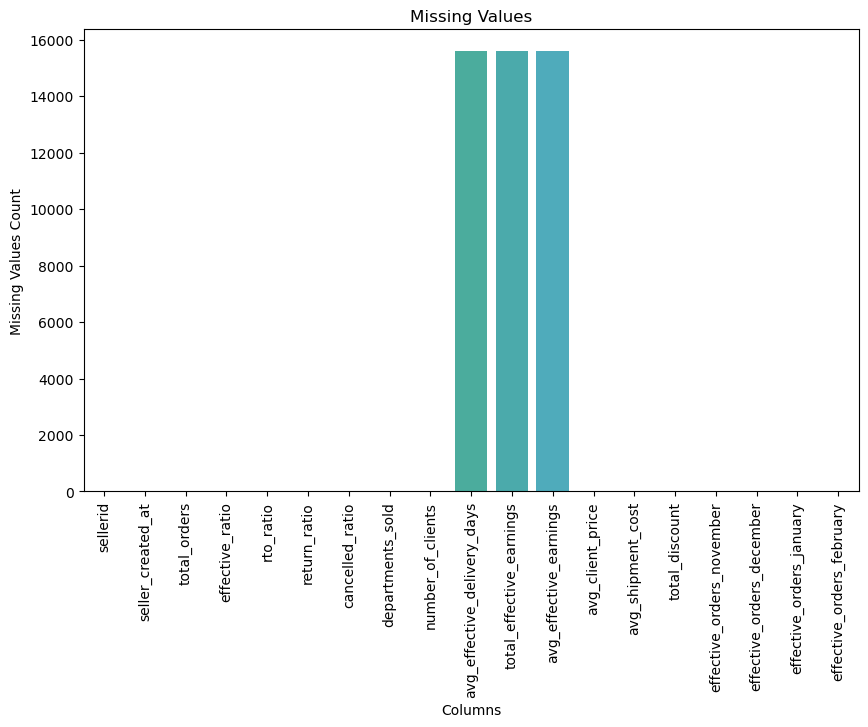

In [24]:
#Visualizing the missing values
nan_vis(df02sellers)

The missing values are from sellers without effective orders, this is further analyzed in the first iteration. 

The NaN values of total_effective_earnings and avg_effective_earnings were replaced by 0, and the avg_effective_delivery_days replaced by 6 assuming that the experience was worse than the average

In [25]:
# Imputing with 0
replace_nan_with_zero(df02sellers, ["total_effective_earnings", "avg_effective_earnings"])

#Imputing with 6 the avg delivery days (based on insight of the iteration 1)
df02sellers["avg_effective_delivery_days"] = df02sellers["avg_effective_delivery_days"].fillna(6)


#Sanity check
nan_vis(df02sellers)

'There are no missing values'

In [26]:
#Converting to datetime
#1, turning it to a datetime
df02sellers["seller_created_at"] = pd.to_datetime(df02sellers["seller_created_at"], utc=True)

#2, strings in the desired format
df02sellers["seller_created_at"] = df02sellers["seller_created_at"].dt.strftime('%Y-%m-%d')

#3 Convert it back to datetime 
df02sellers["seller_created_at"] = pd.to_datetime(df02sellers['seller_created_at'])

In [27]:
#Sanity check
df02sellers.dtypes

sellerid                                int64
seller_created_at              datetime64[ns]
total_orders                            int64
effective_ratio                       float64
rto_ratio                             float64
return_ratio                          float64
cancelled_ratio                       float64
departments_sold                        int64
number_of_clients                       int64
avg_effective_delivery_days           float64
total_effective_earnings              float64
avg_effective_earnings                float64
avg_client_price                      float64
avg_shipment_cost                     float64
total_discount                        float64
effective_orders_november               int64
effective_orders_december               int64
effective_orders_january                int64
effective_orders_february               int64
dtype: object

In [28]:
#Reviewing the number of rows
df02sellers.count()

sellerid                       47704
seller_created_at              47704
total_orders                   47704
effective_ratio                47704
rto_ratio                      47704
return_ratio                   47704
cancelled_ratio                47704
departments_sold               47704
number_of_clients              47704
avg_effective_delivery_days    47704
total_effective_earnings       47704
avg_effective_earnings         47704
avg_client_price               47704
avg_shipment_cost              47704
total_discount                 47704
effective_orders_november      47704
effective_orders_december      47704
effective_orders_january       47704
effective_orders_february      47704
dtype: int64

In [29]:
#Renaming for consistency
df02sellers.rename(columns={"sellerid": "seller_id"}, inplace=True)

### Target variable:

Target variable called churn:

    - churn: 1 → seller churned (did not place an order between March 30 to April 28)
    - churn: 0 → seller not churned (≥1 effective order between March 30 to April 28)

18.7% of the sellers have not churned. The imbalance in the target variable persists, though it is less severe than in iteration 1

In [30]:
#Uploading the DF
df02target = pd.read_csv('../Data/elenas-it2_target.csv')

#Sanity check
df02target.head(5)

,seller_id,orders_last_month
0,3,0
1,6,0
2,20,0
3,31,0
4,46,0


In [31]:
#Turning the target variable into a binary column
df02target["churn"] = df02target["orders_last_month"].map(lambda x: 0 if x >=1 else 1)

#Removing the orders last month column
df02target.drop("orders_last_month", axis=1, inplace=True)

#Sanity check
df02target.head(5)

,seller_id,churn
0,3,1
1,6,1
2,20,1
3,31,1
4,46,1


In [32]:
#Merging the DFs
df02sellers2 = pd.merge(df02sellers, df02target, on="seller_id", how="left")

In [33]:
#Basic results
print(df02sellers2["churn"].value_counts())
print(f"{8944/(8944+38760)*100}% of the sellers have not churned")

1    38760
0     8944
Name: churn, dtype: int64
18.74895186986416% of the sellers have not churned


### Referrals
- The referral information is only included for consistency with iteration 1, but Elenas did not share the data to include them in the model

In [34]:
#Uploading the DF
df02referrals = pd.read_excel("../Data/referrals.xlsx")

#Sanity check
df02referrals.head(5)

,seller_id,is_referred,referred_by_seller_id
0,10030084,1,10306503
1,10030089,1,10299985
2,10030090,1,10305933
3,10030095,1,10178862
4,10030098,1,22098


In [35]:
df02referrals.count()

seller_id                102580
is_referred              102580
referred_by_seller_id    102580
dtype: int64

In [36]:
#Removing referred by seller id 
df02referrals.drop("referred_by_seller_id", axis=1, inplace=True)

In [37]:
#Sanity check
print(f'Number of referred sellers {df02referrals["is_referred"].value_counts()}')

print(f'Number of sellers (original Df: {df02sellers2["seller_id"].count()}')

Number of referred sellers 1    102580
Name: is_referred, dtype: int64
Number of sellers (original Df: 47704


In [38]:
#Merging the DFs
df02sellers3 = pd.merge(df02sellers2, df02referrals, on="seller_id", how="left")

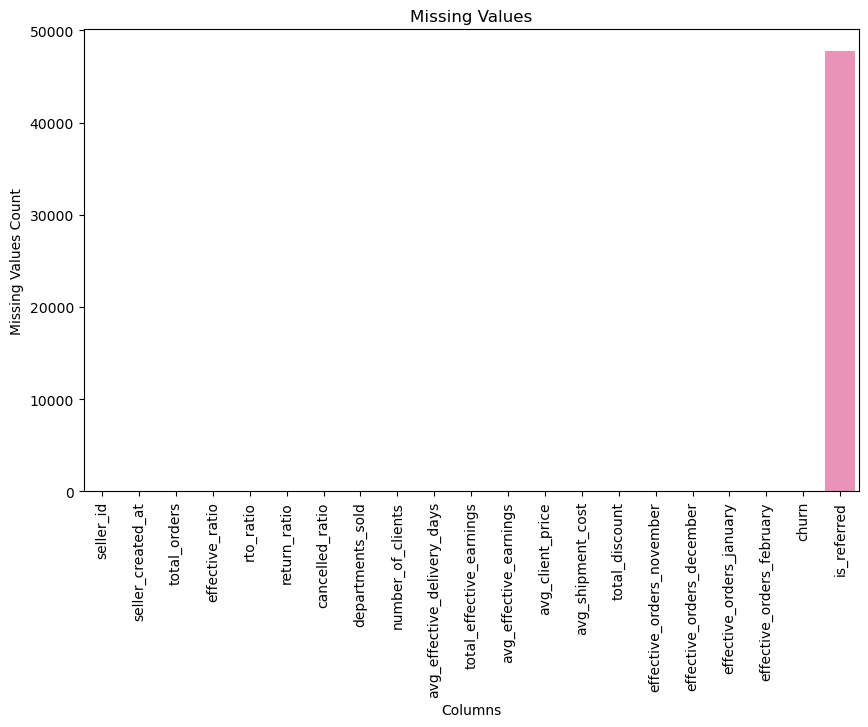

,seller_id,seller_created_at,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,...,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,effective_orders_november,effective_orders_december,effective_orders_january,effective_orders_february,churn,is_referred
0,11415920,2022-09-30,1,1.000000,0.000000,0.000000,0.000000,1,1,2.000000,...,5600.000000,32500.000000,0.000000,0.0,0,0,0,0,1,0.0
1,11415923,2022-09-30,70,0.685714,0.142857,0.014286,0.157143,4,47,6.729167,...,7779.354167,68062.857143,8231.428571,0.0,2,8,7,4,0,0.0
2,11415930,2022-09-30,2,1.000000,0.000000,0.000000,0.000000,1,1,10.000000,...,4300.000000,28900.000000,5500.000000,0.0,1,0,0,0,1,0.0
3,11415933,2022-09-30,7,0.428571,0.285714,0.000000,0.285714,1,1,3.333333,...,1400.000000,74799.857143,7857.142857,0.0,1,0,0,2,1,0.0
4,11415940,2022-09-30,2,0.500000,0.000000,0.000000,0.500000,2,2,9.000000,...,10700.000000,56500.000000,3750.000000,0.0,0,0,0,0,1,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47699,11886487,2023-04-27,1,1.000000,0.000000,0.000000,0.000000,1,1,0.000000,...,2708.000000,12900.000000,0.000000,0.0,0,0,0,0,0,0.0
47700,11886505,2023-04-27,1,1.000000,0.000000,0.000000,0.000000,1,1,0.000000,...,19965.000000,241900.000000,7500.000000,0.0,0,0,0,0,0,0.0
47701,11886533,2023-04-27,1,1.000000,0.000000,0.000000,0.000000,1,1,0.000000,...,11802.000000,113600.000000,14000.000000,0.0,0,0,0,0,0,0.0
47702,11886542,2023-04-27,2,1.000000,0.000000,0.000000,0.000000,1,1,0.000000,...,6905.500000,54800.000000,11000.000000,0.0,0,0,0,0,0,0.0


In [39]:
#Sanity check:
df02sellers3["seller_id"].count()

#Reviewing the zero values
nan_vis(df02sellers3)

#Replacing with 0 since they are not referred
replace_nan_with_zero(df02sellers3, ["is_referred"])



In [40]:
#Sanity check
nan_vis(df02sellers3)

'There are no missing values'

### Products

- Number of photos dropped by the conclusion of iteration 1
- Included the total number of products shared as a behavioral feature to complement the data frame, and to add some diversity to the information, which is mostly transactional

In [41]:
#Uploading the DF
df02products = pd.read_csv("../data/elenas-it2_cart_agg.csv")

#Sanity check
df02products.head(5)

,seller_id,avg_cart_items,avg_vendor_discount,number_of_products,number_of_photos,number_of_categories,average_prod_existence_days
0,11415920,1.0,0.000000,1,0,1,565.000000
1,11415923,1.0,6417.876712,46,0,16,456.986301
2,11415930,1.0,0.000000,2,0,2,618.500000
3,11415933,1.0,4456.714286,7,0,5,612.857143
4,11415940,1.0,0.000000,2,0,2,310.500000


In [42]:
#Dropped by the conclusion of iteration 1
df02products.drop("number_of_photos", axis=1, inplace=True)

In [43]:
#Organizing the values (decimals)
df02products["average_prod_existence_days"] = df02products["average_prod_existence_days"].round(0)
df02products["avg_vendor_discount"] = df02products["avg_vendor_discount"].round(0)

#Review
df02products.head(2)

,seller_id,avg_cart_items,avg_vendor_discount,number_of_products,number_of_categories,average_prod_existence_days
0,11415920,1.0,0.0,1,1,565.0
1,11415923,1.0,6418.0,46,16,457.0


In [44]:
#Joining the DFs
df02sellers4 = pd.merge(df02sellers3, df02products, on="seller_id", how="left")

#Sanity check:
df02sellers4.head(5)


,seller_id,seller_created_at,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,...,effective_orders_december,effective_orders_january,effective_orders_february,churn,is_referred,avg_cart_items,avg_vendor_discount,number_of_products,number_of_categories,average_prod_existence_days
0,11415920,2022-09-30,1,1.000000,0.000000,0.000000,0.000000,1,1,2.000000,...,0,0,0,1,0.0,1.0,0.0,1,1,565.0
1,11415923,2022-09-30,70,0.685714,0.142857,0.014286,0.157143,4,47,6.729167,...,8,7,4,0,0.0,1.0,6418.0,46,16,457.0
2,11415930,2022-09-30,2,1.000000,0.000000,0.000000,0.000000,1,1,10.000000,...,0,0,0,1,0.0,1.0,0.0,2,2,618.0
3,11415933,2022-09-30,7,0.428571,0.285714,0.000000,0.285714,1,1,3.333333,...,0,0,2,1,0.0,1.0,4457.0,7,5,613.0
4,11415940,2022-09-30,2,0.500000,0.000000,0.000000,0.500000,2,2,9.000000,...,0,0,0,1,0.0,1.0,0.0,2,2,310.0


In [45]:
#Organizing the decimals:
decimal_cols = ["effective_ratio", "rto_ratio", "return_ratio", "cancelled_ratio", "avg_effective_delivery_days"]

for col in decimal_cols:
    df02sellers4[col] = df02sellers4[col].round(2)

In [46]:
#Sanity check:
df02sellers4.head(5)


,seller_id,seller_created_at,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,...,effective_orders_december,effective_orders_january,effective_orders_february,churn,is_referred,avg_cart_items,avg_vendor_discount,number_of_products,number_of_categories,average_prod_existence_days
0,11415920,2022-09-30,1,1.00,0.00,0.00,0.00,1,1,2.00,...,0,0,0,1,0.0,1.0,0.0,1,1,565.0
1,11415923,2022-09-30,70,0.69,0.14,0.01,0.16,4,47,6.73,...,8,7,4,0,0.0,1.0,6418.0,46,16,457.0
2,11415930,2022-09-30,2,1.00,0.00,0.00,0.00,1,1,10.00,...,0,0,0,1,0.0,1.0,0.0,2,2,618.0
3,11415933,2022-09-30,7,0.43,0.29,0.00,0.29,1,1,3.33,...,0,0,2,1,0.0,1.0,4457.0,7,5,613.0
4,11415940,2022-09-30,2,0.50,0.00,0.00,0.50,2,2,9.00,...,0,0,0,1,0.0,1.0,0.0,2,2,310.0


In [47]:
#Reviewing NaN
nan_vis(df02sellers4)

'There are no missing values'

In [48]:
#Including the information of the shared products
df02products2 = pd.read_csv('../data/elenas-it2_product_shared.csv')

#Reviewing the values
df02products2.head(2)

,id,total_products_shared
0,11415881,0
1,11415882,0


In [49]:
#Number of sellers
df02products2["id"].count()

#Renaming the id column for consistency
df02products2.rename(columns={"id": "seller_id"}, inplace=True)

In [50]:
#Merging the files
df02sellers5 = pd.merge(df02sellers4, df02products2, on="seller_id", how="left")

In [51]:
#Checking missing values
nan_vis(df02sellers5)

'There are no missing values'

### Credits & Vouchers

* Included the number of vouchers, credits and used credits 


In [52]:
#Uploading the DF
df02vouchers = pd.read_csv('../data/elenas-it2_vouchers.csv')

In [53]:
#Reviewing missing values
print(nan_vis(df02vouchers))

#df head
df02vouchers.head(3)

There are no missing values


,seller_id,number_of_vouchers
0,11415881,7
1,11415882,8
2,11415883,6


In [54]:
#Merging the DFs
df02sellers6 = pd.merge(df02sellers5, df02vouchers, on="seller_id", how="left")

In [55]:
#Credits info
df02credits = pd.read_csv("../data/elenas-it2_credits.csv")

#Reviewing the columns
df02credits.head(3)

,seller_id,number_of_credits,number_of_used_credits,avg_credit_amount
0,11415881,0,0,NaN
1,11415882,0,0,NaN
2,11415883,0,0,NaN


In [56]:
#Replacing the NaN with 0 since there are no credits
replace_nan_with_zero(df02credits, ["avg_credit_amount"])

,seller_id,number_of_credits,number_of_used_credits,avg_credit_amount
0,11415881,0,0,0.0
1,11415882,0,0,0.0
2,11415883,0,0,0.0
3,11415884,0,0,0.0
4,11415885,0,0,0.0
...,...,...,...,...
470693,11886605,0,0,0.0
470694,11886606,0,0,0.0
470695,11886607,0,0,0.0
470696,11886608,0,0,0.0


In [57]:
#Merging the DFs
df02sellers6 = pd.merge(df02sellers6, df02credits, on="seller_id", how="left")

In [58]:
#Sanity check
nan_vis(df02sellers6)

'There are no missing values'

In [110]:
#Finall review:
print(f"""
      - Finall shape: {df02sellers6.shape}
      - Target variable distribution {df02sellers6["churn"].value_counts()}
      """)




      - Finall shape: (47704, 31)
      - Target variable distribution 1    38760
0     8944
Name: churn, dtype: int64
      


### Saving the final DF of the Iteration 2

In [59]:
#Checkpoint:
df02sellers6.to_csv('../Data/elenas-it2-postwrangling.csv')

---

## Iteration 1: sellers created after June 2021

**DF Structure**

|  Name |Comments   |
|---|---|
| DF01sellers1 |original sellers DF |
| DF01sellers2 | Include the threshold for the target variable (jun-2021)   |
| DF01sellers3| Include the orders information and dropped the sellers without orders   |
| DF01sellers4| Include the target variable   |
| DF01sellers5| Include referrals information   |
| DF01sellers6| Include products and categories information   |
| DF01sellers7| Include financial information of credits and vouchers   |

DF01sellers7 ended up with 263,265 rows and 32 columns (3 of which need to be dropped later). The columns can be labeled as transactional, operational, and behavioral information.


### Sellers:

- The DF had 1,723,856 sellers, but I established a threshold of sellers with a creation date of June 2021 or later. Prior to that period, there was a national strike that affected the conditions. Additionally, as an early-stage company with many iterations in different areas, the sellers' experience has also changed
- Additional sellers were dropped, such as those who were banned from the business model and others labeled as ex-pioneer. These sellers had a very different earnings scheme and would add noise to the model
- Additionally, non-relevant columns, such as business model or referred_by_id, were dropped
- The final seller DF has 1,598,970 sellers

In [60]:
#Uploading the DF
df01sellers1 = pd.read_csv("../Data/seller.csv")

#Review:
df01sellers1.head(3)

,id,created_at,referred_by_id,user_id,banned_elenas,ex_pioneer,business_model
0,11391541,2022-09-23 00:10:33.003499+02,NaN,11419818,False,False,DEFAULT
1,11534279,2022-11-21 00:36:52.063471+01,NaN,11562762,False,False,DEFAULT
2,11543049,2022-11-25 13:52:46.429364+01,NaN,11571595,False,False,DEFAULT


In [61]:
# Originally, were are 1.723.856 sellers
df01sellers1.count()

id                1723856
created_at        1723856
referred_by_id          0
user_id           1723856
banned_elenas     1723856
ex_pioneer        1723856
business_model    1723856
dtype: int64

In [62]:
#Reviewing the types of data
df01sellers1.dtypes

# created at has to be changed

id                  int64
created_at         object
referred_by_id    float64
user_id             int64
banned_elenas        bool
ex_pioneer           bool
business_model     object
dtype: object

In [63]:
#convert the 'created_at' column from a string to a datetime object with timezone information.
df01sellers1['created_at'] = pd.to_datetime(df01sellers1['created_at'], utc=True)
#convert the datetime objects to strings in the desired day format ('YYYY-MM-DD').
df01sellers1['created_at'] = df01sellers1['created_at'].dt.strftime('%Y-%m-%d')

#Convert it back to datetime 
df01sellers1['created_at'] = pd.to_datetime(df01sellers1['created_at'])

#Sanity check:
print(df01sellers1['created_at'].head(3))

print(df01sellers1['created_at'].dtype)


0   2022-09-22
1   2022-11-20
2   2022-11-25
Name: created_at, dtype: datetime64[ns]
datetime64[ns]


In [64]:
#Including the seller creation threshold 
threshold_date = pd.to_datetime('2021-06-01')
df01sellers2 = df01sellers1[df01sellers1['created_at'] >= threshold_date]

In [65]:
#Banned review:
df01sellers2["banned_elenas"].value_counts()

# Deleting the banned sellers and resetting the index
df01sellers2 = df01sellers2[df01sellers2["banned_elenas"] != True].reset_index(drop=True)


In [66]:
#Referrals elimination
df01sellers2.drop("referred_by_id", axis=1, inplace=True)

In [67]:
#business model review:
df01sellers2["business_model"].value_counts()
print("All the sellers have the same business model, the column will be eliminated")
df01sellers2.drop("business_model", axis=1, inplace=True)

All the sellers have the same business model, the column will be eliminated


In [68]:
# ex pioneer review:
df01sellers2["ex_pioneer"].value_counts()
print(f"All the values of the ex_pioneer are the same. The column will be dropped")

df01sellers2.drop("ex_pioneer", axis=1, inplace=True)

All the values of the ex_pioneer are the same. The column will be dropped


In [69]:
#Reviewing the NaN values:
print(nan_vis(df01sellers2))

There are no missing values


In [70]:
#renaming id to seller_id for consistency
df01sellers2.rename(columns={'id': 'seller_id'}, inplace=True)

### Orders

* I dropped the sellers who had not placed any orders since they are not relevant to the business question. The number of sellers for analysis is 279,059
* The additional columns are aggregates of different metrics for each seller. Depending on the variable's relevance during the modeling stage, some variables may be disaggregated
* There are 67.5K NaN values for average effective delivery days. These come from sellers without effective orders, but they will be addressed later
* The sellers also had NaN values for columns such as total earnings or average earnings. These missing values were replaced with 0

In [71]:
#Uploading the DF
df01orders1 = pd.read_csv("../Data/total_orders_agg.csv")

#Review: 
df01orders1.head(3)

,seller_id,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,total_effective_earnings,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,avg_discount
0,3,47,0.851064,0.000,0.0,0.148936,5,8,6.3,188965.0,4724.125,202888.808511,7755.319149,0.0,0.0
1,6,2,0.000000,1.000,0.0,0.000000,2,2,NaN,NaN,NaN,125094.000000,6500.000000,0.0,0.0
2,20,8,0.500000,0.125,0.0,0.375000,3,5,3.0,162100.0,40525.000,142312.500000,5000.000000,0.0,0.0


In [72]:
#Replacing the values of total effective earnings and avg effective earnings
df01orders2 = replace_nan_with_zero(df01orders1,["total_effective_earnings", "avg_effective_earnings"])

#Sanity check:
df01orders2.count()

seller_id                      279059
total_orders                   279059
effective_ratio                279059
rto_ratio                      279059
return_ratio                   279059
cancelled_ratio                279059
departments_sold               279059
number_of_clients              279059
avg_effective_delivery_days    211476
total_effective_earnings       279059
avg_effective_earnings         279059
avg_client_price               279059
avg_shipment_cost              279059
total_discount                 279059
avg_discount                   279059
dtype: int64

In [73]:
# dfseller3: Left join between sellers (dfseller2) and orders dforders2
df01sellers3 = pd.merge(df01sellers2, df01orders2, on="seller_id", how="left")

#Review:
df01sellers3.head(3)

,seller_id,created_at,user_id,banned_elenas,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,total_effective_earnings,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,avg_discount
0,11391541,2022-09-22,11419818,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,11534279,2022-11-20,11562762,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,11543049,2022-11-25,11571595,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
#Drop sellers without any order
df01sellers3.drop(df01sellers3[df01sellers3["total_orders"].isna()].index, inplace=True)


### DF target variable, first iteration

- It is defined as a binary column for the effective orders (orders with state as completed, distribution, created, dispatched, in process, initial, ordered) and order created at >= 2023-03-30

- The name of the variable is called: order_last_month

In [75]:
#Uploading the DF
dftarget_it1 = pd.read_csv("../Data/target_var_first_iteration.csv")

#Reviewing the DF
dftarget_it1.head(3)

,seller_id,num_orders
0,3,0
1,6,0
2,20,0


In [76]:
#Replacing the num_orders to a binary number
dftarget_it1["num_orders"] = dftarget_it1["num_orders"].map(lambda x: 0 if x >= 1 else 1)

#Renaming the num_orders to order_last_month
dftarget_it1.rename(columns={"num_orders": "order_last_month"}, inplace=True)

In [77]:
#Joining sellers3 with target variable, and name it dfseller4
df01sellers4 = pd.merge(df01sellers3, dftarget_it1, on="seller_id", how="left")

#Reviewing the results:
df01sellers4.head(3)

,seller_id,created_at,user_id,banned_elenas,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,avg_effective_delivery_days,total_effective_earnings,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,avg_discount,order_last_month
0,11571677,2022-12-08,11600263,False,3.0,1.000000,0.0,0.000000,0.000000,1.0,3.0,4.0,16555.0,5518.333333,37533.333333,3666.666667,0.0,0.0,1
1,11583955,2022-12-11,11612556,False,1.0,1.000000,0.0,0.000000,0.000000,1.0,1.0,5.0,7585.0,7585.000000,50000.000000,0.000000,0.0,0.0,1
2,11604304,2022-12-16,11632958,False,7.0,0.714286,0.0,0.142857,0.142857,1.0,5.0,6.6,55497.0,11099.400000,73600.000000,6285.714286,0.0,0.0,1


### Referrals review:
- 2 relevant columns, is_referred, that will be binary and referred_by_seller_id that will change to a binary column named has_referred
- After multiple analyses, the is_reffered column does not contain matching information for the sellers. The column will be dropped later on

In [78]:
#Uploading the data
df01referrals = pd.read_excel("../Data/referrals.xlsx")

#Reviewing the info
df01referrals.head(3)

,seller_id,is_referred,referred_by_seller_id
0,10030084,1,10306503
1,10030089,1,10299985
2,10030090,1,10305933


In [79]:
# Referred sellers
df01referrals3 = df01referrals.drop(["referred_by_seller_id"], axis=1)
#Sanity check
df01referrals3.head(5)

,seller_id,is_referred
0,10030084,1
1,10030089,1
2,10030090,1
3,10030095,1
4,10030098,1


In [80]:
#Joining the 2 tables
df01referrals2 = pd.merge(df01referrals, df01sellers2, left_on="referred_by_seller_id", right_on="seller_id", how='left')


In [81]:
#drop columns
#dfreferrals2.head(5)
df01referrals2.drop(["seller_id_x", "seller_id_y", "is_referred", "created_at", "user_id"], axis=1, inplace=True)

#Sanity check
df01referrals2.head(5)

,referred_by_seller_id,banned_elenas
0,10306503,False
1,10299985,False
2,10305933,False
3,10178862,NaN
4,22098,NaN


In [82]:
#Binary column of has_referred
df01referrals2["has_referred"] = df01referrals2["referred_by_seller_id"].map(lambda x: 0 if x >= 1 else 1)

#Rename
df01referrals2.rename(columns={"referred_by_seller_id": "seller_id"}, inplace=True)

#Sanity check
df01referrals2.head()

,seller_id,banned_elenas,has_referred
0,10306503,False,0
1,10299985,False,0
2,10305933,False,0
3,10178862,NaN,0
4,22098,NaN,0


In [83]:
#Join between sellers and referred sellers (dfreferrals3)
df01sellers5 = pd.merge(df01sellers4, df01referrals3, on="seller_id", how="left")

Validation that apparently there are no referrals:

- Multiple analyses were performed, and there are no matches. Apparently the selected types of both tables are different, since the created at values are quite different

In [84]:
#Revieweing for duplicates
set(df01sellers4.seller_id).intersection(set(df01referrals3.seller_id))

set()

In [85]:
#One value validation
df01sellers5[df01sellers5["seller_id"] == 10030090].value_counts()

Series([], dtype: int64)

> The cell below takes over 3 mins to run

In [86]:
#Validation of all the rows
#New validation df
df_referral_val = df01sellers5[["seller_id"]].copy()

# List of each seller_id of dfreferrals3
referral_validation = df01referrals3["seller_id"].tolist()

# Iterate through each element of dfsellers5, returning a True or False
df_referral_val["is_duplicated"] = df01sellers5["seller_id"].apply(lambda x: True if x in referral_validation else False)

# Count the values
value_counts = df_referral_val["is_duplicated"].value_counts()
print(value_counts)

False    227069
Name: is_duplicated, dtype: int64


In [87]:
#Join between sellers and sellers that have referred
df01sellers5 = pd.merge(df01sellers5,df01referrals2, on="seller_id", how="left" )

In [88]:
replace_nan_with_zero(df01sellers5, ["is_referred", "has_referred"])

,seller_id,created_at,user_id,banned_elenas_x,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,...,total_effective_earnings,avg_effective_earnings,avg_client_price,avg_shipment_cost,total_discount,avg_discount,order_last_month,is_referred,banned_elenas_y,has_referred
0,11571677,2022-12-08,11600263,False,3.0,1.000000,0.000000,0.000000,0.000000,1.0,...,16555.0,5518.333333,37533.333333,3666.666667,0.0,0.0,1,0.0,NaN,0.0
1,11583955,2022-12-11,11612556,False,1.0,1.000000,0.000000,0.000000,0.000000,1.0,...,7585.0,7585.000000,50000.000000,0.000000,0.0,0.0,1,0.0,NaN,0.0
2,11604304,2022-12-16,11632958,False,7.0,0.714286,0.000000,0.142857,0.142857,1.0,...,55497.0,11099.400000,73600.000000,6285.714286,0.0,0.0,1,0.0,NaN,0.0
3,11621203,2022-12-23,11649875,False,3.0,0.333333,0.333333,0.000000,0.333333,1.0,...,0.0,0.000000,69885.000000,7333.333333,0.0,0.0,1,0.0,NaN,0.0
4,11634194,2022-12-31,11662886,False,1.0,0.000000,0.000000,0.000000,1.000000,1.0,...,0.0,0.000000,51700.000000,11000.000000,0.0,0.0,1,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
263108,11391291,2022-09-22,11419567,False,1.0,0.000000,0.000000,1.000000,0.000000,1.0,...,0.0,0.000000,70000.000000,7500.000000,0.0,0.0,1,0.0,False,0.0
263109,11391299,2022-09-22,11419575,False,5.0,0.800000,0.000000,0.000000,0.200000,1.0,...,6600.0,1650.000000,27460.000000,7500.000000,0.0,0.0,1,0.0,NaN,0.0
263110,11391304,2022-09-22,11419580,False,3.0,0.000000,1.000000,0.000000,0.000000,1.0,...,0.0,0.000000,70466.666667,0.000000,0.0,0.0,1,0.0,NaN,0.0
263111,11389365,2022-09-22,11417638,False,8.0,0.375000,0.250000,0.000000,0.375000,3.0,...,81248.0,27082.666667,263325.000000,1375.000000,0.0,0.0,1,0.0,NaN,0.0


In [89]:
#Droping the referred_by column
df01sellers5.columns

df01sellers5.drop(["is_referred", "banned_elenas_y", "banned_elenas_x"], axis=1, inplace=True)

### Products:

- Include information on how the sellers interacted with the different products and categories

In [90]:
#Uploading the info
df01products = pd.read_csv("../Data/total_cart_agg.csv")

#Review of the head:
df01products.head(3)

,seller_id,avg_cart_items,avg_vendor_discount,number_of_products,number_of_photos,number_of_categories,average_prod_existence_days
0,3,1.0,9880.460317,44,9,25,645.111111
1,6,1.0,0.000000,2,1,2,978.000000
2,20,1.0,0.000000,5,0,4,666.000000


In [91]:
#Join with the sellers Table
df01sellers6 = pd.merge(df01sellers5, df01products, on="seller_id", how="left")

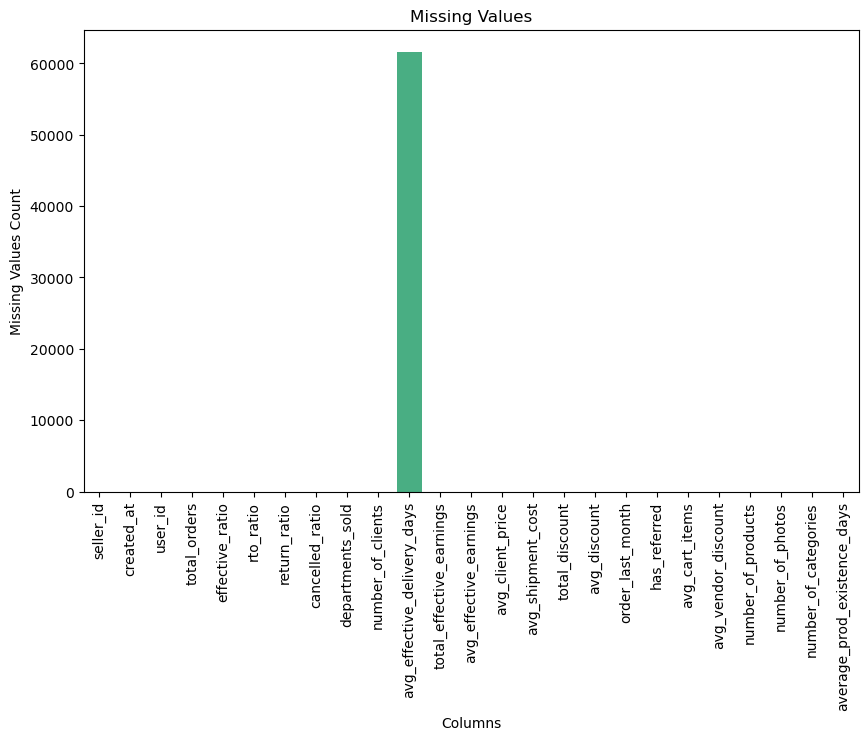

In [92]:
#Visualization of the NaNs
nan_vis(df01sellers6)

In [93]:
#Uploading the file
df01products2 = pd.read_csv("../Data/products_shared.csv")

#Renaming for consistency
df01products2.rename(columns={'id': 'seller_id'}, inplace=True)

#Reviewing the head
df01products2.head(5)

,seller_id,total_products_shared
0,10287258,0
1,10287259,0
2,10287260,0
3,10287261,0
4,10287262,0


In [94]:
#Merge products shared with sellers
df01sellers6 = pd.merge(df01sellers6, df01products2, on="seller_id", how="left")

#Reviewing
df01sellers6.head(2)

,seller_id,created_at,user_id,total_orders,effective_ratio,rto_ratio,return_ratio,cancelled_ratio,departments_sold,number_of_clients,...,avg_discount,order_last_month,has_referred,avg_cart_items,avg_vendor_discount,number_of_products,number_of_photos,number_of_categories,average_prod_existence_days,total_products_shared
0,11571677,2022-12-08,11600263,3.0,1.0,0.0,0.0,0.0,1.0,3.0,...,0.0,1,0.0,1.0,0.0,3,0,3,453.0,1
1,11583955,2022-12-11,11612556,1.0,1.0,0.0,0.0,0.0,1.0,1.0,...,0.0,1,0.0,1.0,7485.0,1,0,1,423.0,0


### Transactional information: credits & vouchers

The shape of the df is (1599047, 4)
Number of datapoints: seller_id                 1599047
number_of_credits         1599047
number_of_used_credits    1599047
avg_credit_amount         1344510
dtype: int64

Data types:
seller_id                   int64
number_of_credits           int64
number_of_used_credits      int64
avg_credit_amount         float64
dtype: object
there are 0 duplicate values
there are 254537 NaN values


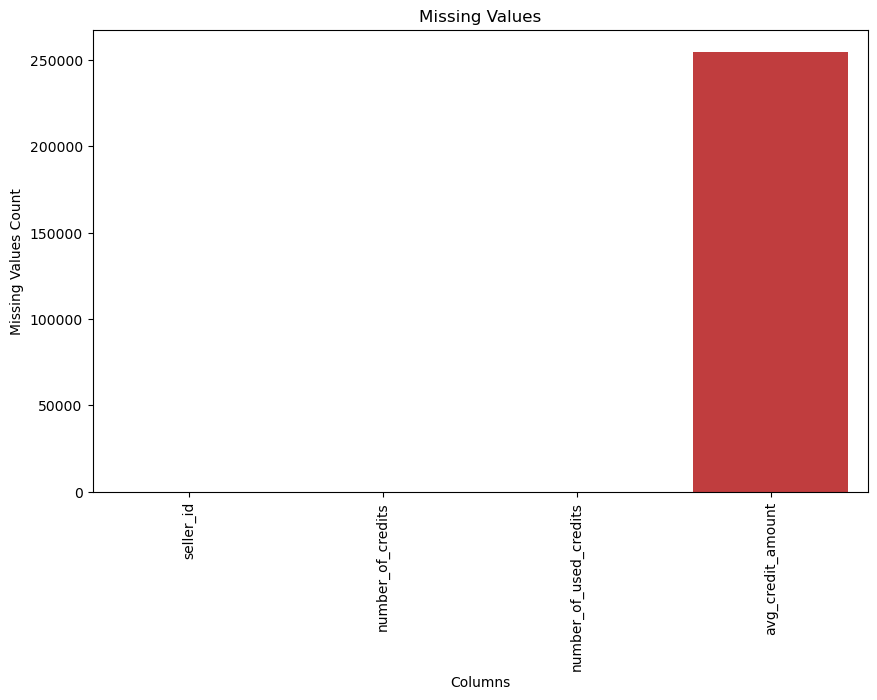

In [95]:
#Uploading the file:
df01transactional = pd.read_csv("../Data/seller_credits.csv")

#Reviewing the results:
basic_info(df01transactional)
nan_vis(df01transactional)


In [96]:
#Replacing with 0 since there are no credits for those sellers
replace_nan_with_zero(df01transactional,["avg_credit_amount"])

,seller_id,number_of_credits,number_of_used_credits,avg_credit_amount
0,10287258,0,0,0.0
1,10287259,0,0,0.0
2,10287260,0,0,0.0
3,10287261,0,0,0.0
4,10287262,0,0,0.0
...,...,...,...,...
1599042,11886605,0,0,0.0
1599043,11886606,0,0,0.0
1599044,11886607,0,0,0.0
1599045,11886608,0,0,0.0


In [97]:
#Joining the DFs
df01sellers7 = pd.merge(df01sellers6, df01transactional, on="seller_id", how="left")

#### Vouchers

In [98]:
#Uploading the data
df01transactional2 = pd.read_csv("../Data/seller_vouchers.csv")

#Reviewing the head
basic_info(df01transactional2)
nan_vis(df01transactional2)

The shape of the df is (1599047, 2)
Number of datapoints: seller_id             1599047
number_of_vouchers    1599047
dtype: int64

Data types:
seller_id             int64
number_of_vouchers    int64
dtype: object
there are 0 duplicate values
there are 0 NaN values


'There are no missing values'

In [99]:
# join sellers7 with the vouchers information
df01sellers7 = pd.merge(df01sellers7, df01transactional2, on="seller_id", how="left")

In [100]:
#Checkpoint
df01sellers7.to_csv('../Data/elenas-it1-preprocessed2.csv')

### Average effective delivery days review:
- The DF has over 60K missing average effective delivery days, these numbers are from sellers that don't have an effective order. So the order status is either cancelled, returned, RTO or lost.

- The data of the avg_effective_delivery_days is skewed to the left, with a mean of 5.5 days and a median of 5 days. Since both results are of effective orders, I will use a higher value to fill the NaN, assuming that due to the order state, the experience was worse. 

- The NaNs were filled with 6, which is the Q3 of the values

- Additionally, there are negative values, they will be updated with the mean


In [101]:
top_del_days = df01sellers7["avg_effective_delivery_days"].round(0).value_counts().sort_values(ascending=False).iloc[:10]
top_del_days = top_del_days.reset_index()  # Reset the index to make 'index' as a column

fig = px.bar(top_del_days,
              x='index',
              y='avg_effective_delivery_days',
              title="First 10 days delivery distribution")
fig.update_layout(xaxis_title="Average Delivery Days", yaxis_title="Number of orders")
fig.show()

The first 10 days delivery seem to follow a normal distribution

In [102]:
avg_delivery_days = df01sellers7["avg_effective_delivery_days"].round(0)

avg_delivery_days

0         4.0
1         5.0
2         7.0
3         2.0
4         NaN
         ... 
263108    NaN
263109    6.0
263110    NaN
263111    4.0
263112    4.0
Name: avg_effective_delivery_days, Length: 263113, dtype: float64

In [103]:
# Avg Delivery days value distribution

fig = px.histogram(avg_delivery_days,
                   x="avg_effective_delivery_days",
                   title="Avg effective delivery days distribution",
                   nbins=20)

# Calculate the mean
mean_delivery_days = np.mean(avg_delivery_days)

# Add mean line to the plot
fig.add_vline(x=mean_delivery_days, line_dash="dash", line_color="red", annotation_text=f"Mean: {mean_delivery_days:.2f}")
fig.update_layout(annotations=[dict(x=mean_delivery_days, y=1, text=f"Mean: {mean_delivery_days:.2f}",
                                    showarrow=True, arrowhead=1, ax=20, ay=-20)])

fig.show()

In [104]:
# Avg Delivery days boxplot
_ = df01sellers7["avg_effective_delivery_days"].round(0)

fig = px.box(_,
                   x="avg_effective_delivery_days",
                   title="Avg effective delivery days distribution")

fig.show()

In [105]:
#The avg delivery days will be changed to 6 for the nan values

df01sellers7["avg_effective_delivery_days"] = df01sellers7["avg_effective_delivery_days"].fillna(6)


In [106]:
# Negative values - replaced with the mean
df01sellers7["avg_effective_delivery_days"] = df01sellers7["avg_effective_delivery_days"].map(lambda x: 5.45 if x < 1 else x)


In [107]:
# Avg Delivery days boxplot

_ = df01sellers7["avg_effective_delivery_days"].round(0)

fig = px.box(_,
                   x="avg_effective_delivery_days",
                   title="Avg effective delivery days updated distribution")

fig.show()

In [108]:
#Checkpoint
df01sellers7.to_csv('../Data/elenas-it1-preprocessed3.csv')
